## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
        cv2.imwrite("output_images/calibration/"+fname[11:],img)

cv2.destroyAllWindows()

## Then, I will perform camera calibration and image distortion correction using one of the chessboard images and test images.

In [2]:
def undistort_image(img,obj_p,img_p):
    
    # Applying the Grayscale transform
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)  
    
    # Camera calibration, given object points, image points, and the shape of the grayscale image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_p, img_p, gray.shape[::-1], None, None)

    # Image distortion correction
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistorted_img

## Undistorting one of the chessboard images:

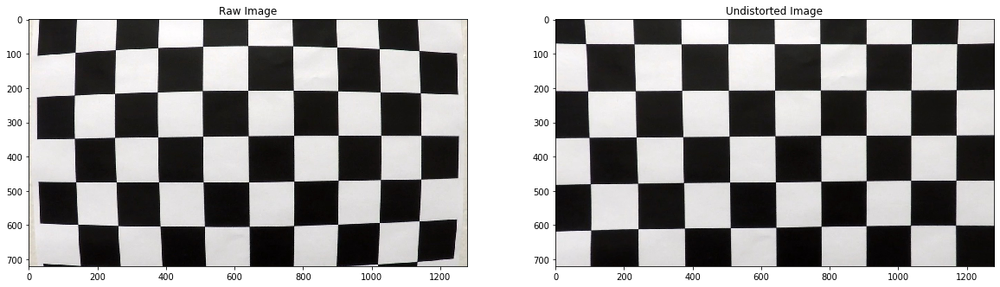

In [3]:
# Reading a Chessboard Image
image = cv2.imread('camera_cal/calibration1.jpg')
undistorted_image = undistort_image(image,objpoints,imgpoints)

image_rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) 
undistorted_image_rgb = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2RGB)

# Vizualize raw image and undistorted image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Raw Image')
ax1.imshow(image_rgb)
ax2.set_title('Undistorted Image')
ax2.imshow(undistorted_image_rgb);

## Undistorting one of the test images:

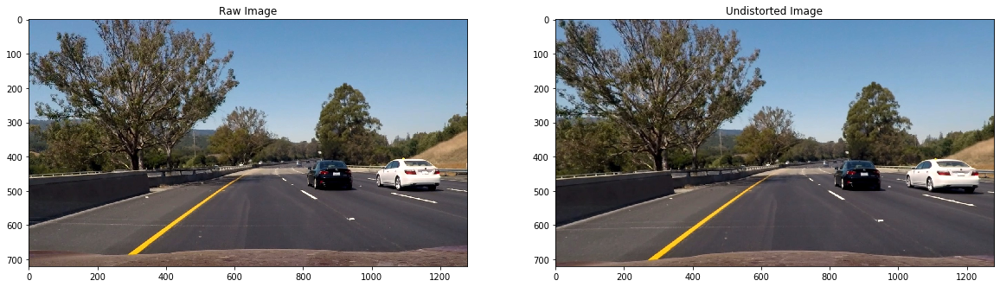

In [4]:
# Reading a Test Image
test_image = cv2.imread('test_images/test6.jpg')
undistorted_test_image = undistort_image(test_image,objpoints,imgpoints)

test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
undistorted_test_image_rgb = cv2.cvtColor(undistorted_test_image, cv2.COLOR_BGR2RGB)

# Vizualize raw image and undistorted image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Raw Image')
ax1.imshow(test_image_rgb)
ax2.set_title('Undistorted Image')
ax2.imshow(undistorted_test_image_rgb);

## Applying sobel thresholds (Absolute, Magnitude and Direction)

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print ("There isn't such orientation")
        return
    
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return this mask as grad_binary image
    return grad_binary

# Calculate gradient magnitude
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    
    # Calculate the magnitude 
    sobel_mag = np.sqrt(np.square(sobelx)+np.square(sobely))
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    
    # Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # Return this mask as mag_binary image
    return mag_binary

# Computes the direction of the gradient and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    sobel = np.arctan2(abs_sobely, abs_sobelx)
    
    # Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(sobel)
    dir_binary[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return dir_binary

## Applying these thresholds for the test image I've just undistorted

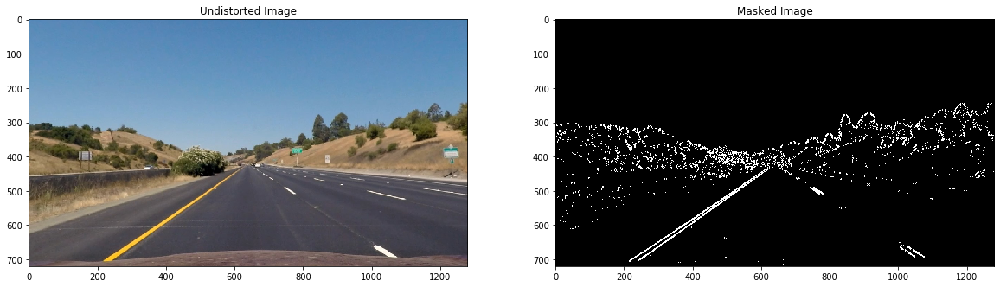

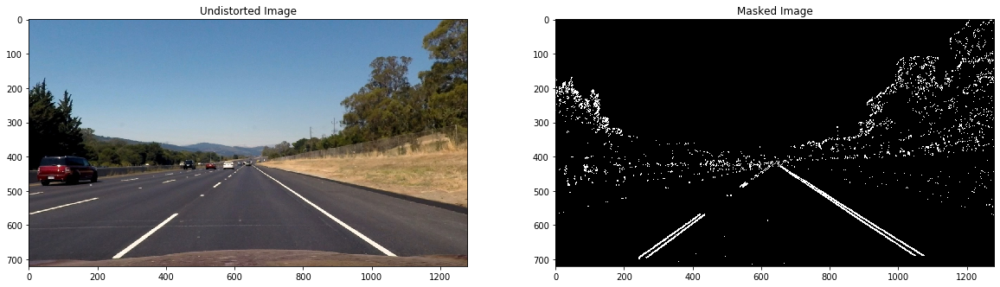

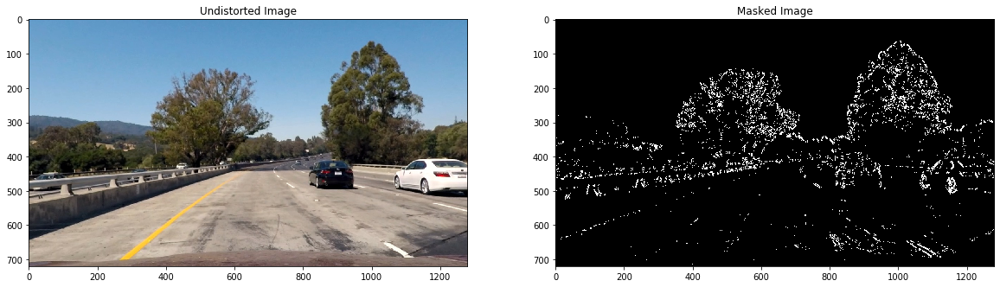

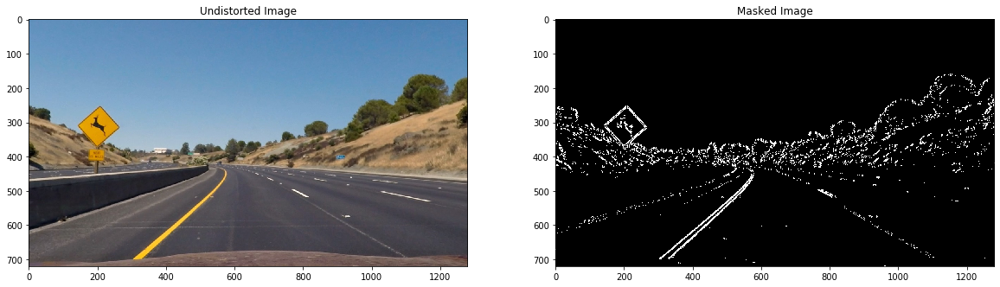

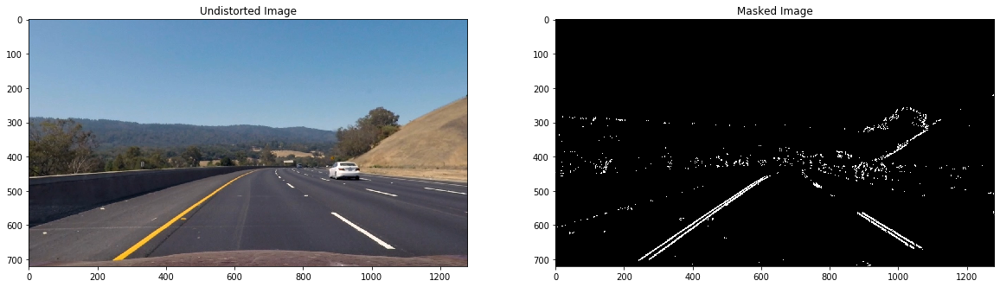

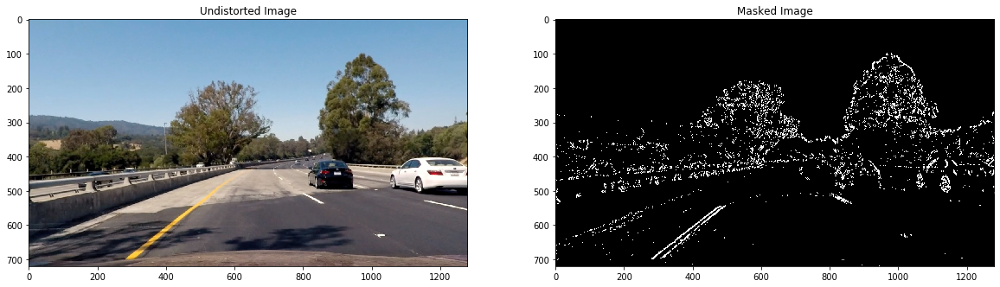

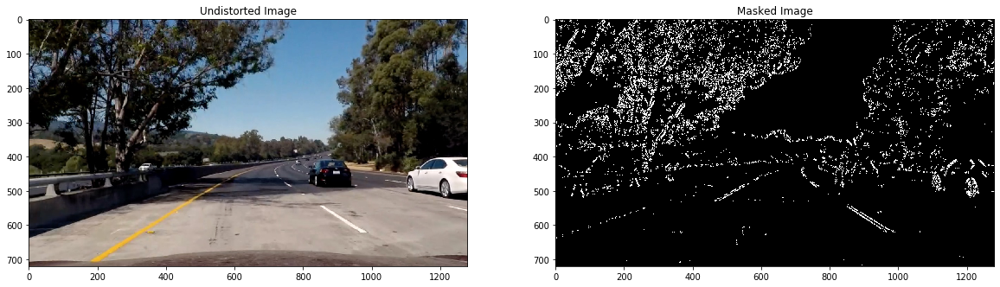

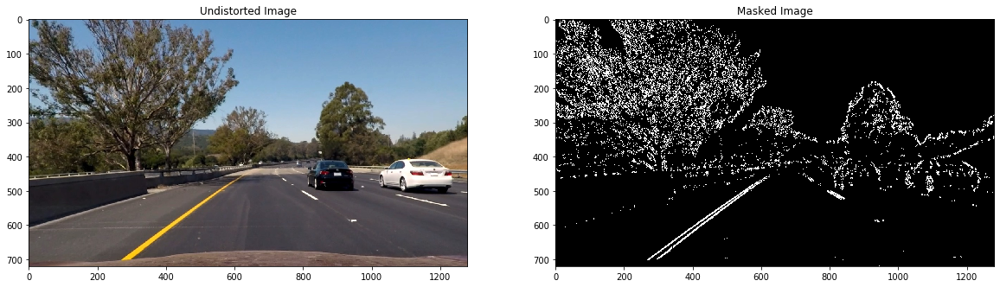

In [6]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    # Choose a Sobel kernel size
    ksize = 7 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(undistorted_img, orient='x', sobel_kernel=ksize, thresh=(15, 255))
    grady = abs_sobel_thresh(undistorted_img, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    mag_binary = mag_thresh(undistorted_img, sobel_kernel=ksize, mag_thresh=(35, 255))
    dir_binary = dir_threshold(undistorted_img, sobel_kernel=ksize, thresh=(0.2, 1.15))

    combined = np.zeros_like(dir_binary)
    combined[ ((gradx == 1) & (grady == 1) & (dir_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
 
    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Undistorted Image')
    ax1.imshow(undistorted_img_rgb)
    ax2.set_title('Masked Image')
    ax2.imshow(combined,cmap='gray');

## Applying Color Thresholds

In [7]:
# Thresholds the L-channel of HLS
def hls_select(img, s_thresh=(0, 255), l_thresh=(0, 255), h_thresh =(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    # Apply a threshold to the L channel
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > s_thresh[0]) & (S <= s_thresh[1]) & (L > l_thresh[0]) & (L <= l_thresh[1]) & (H > h_thresh[0]) & (H <= h_thresh[1])] = 1
    
    # Return a binary image of threshold result
    return binary

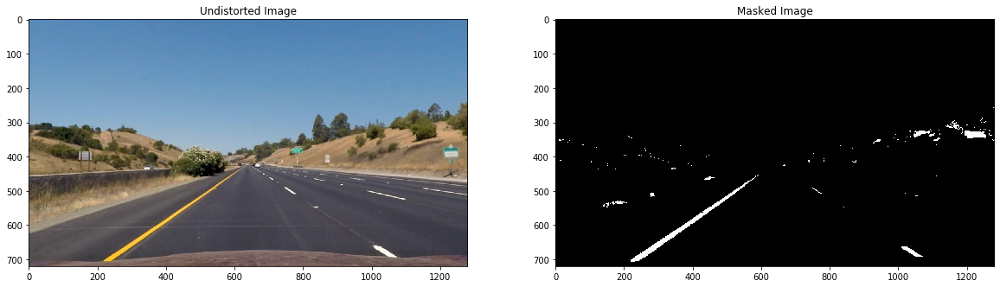

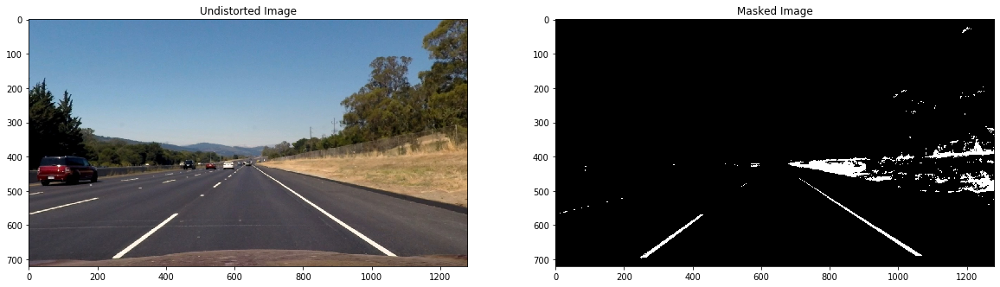

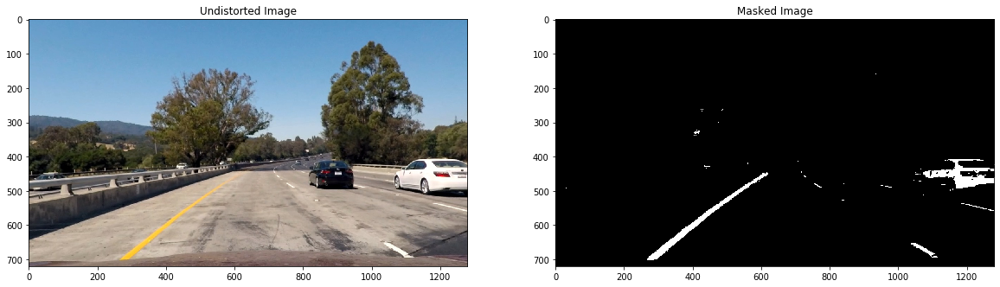

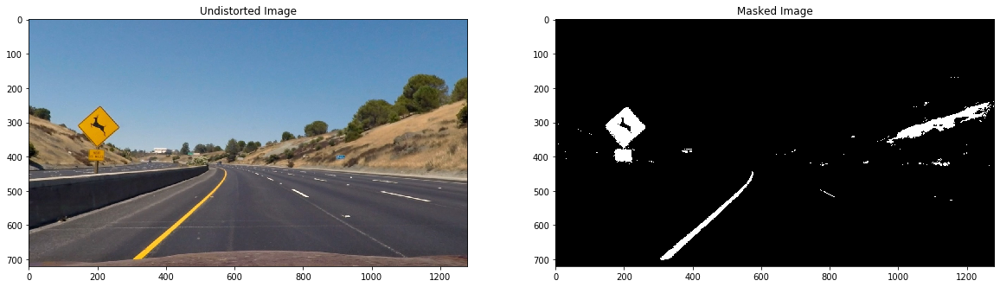

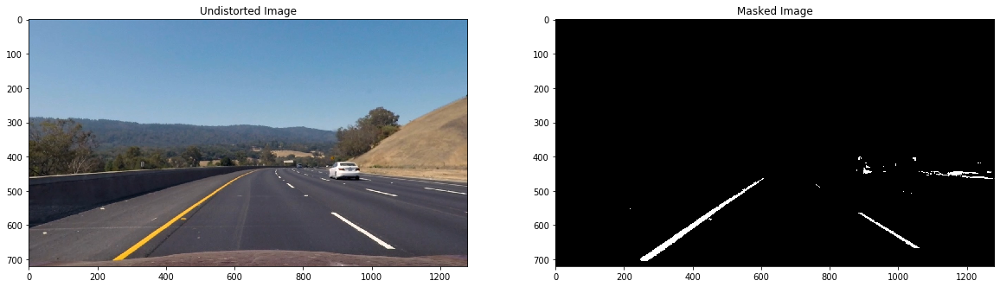

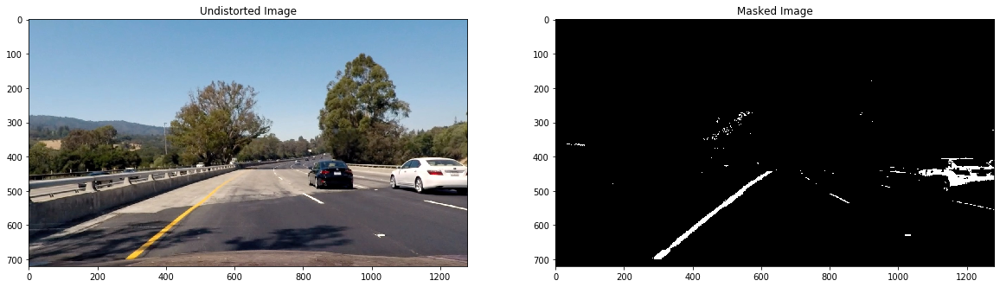

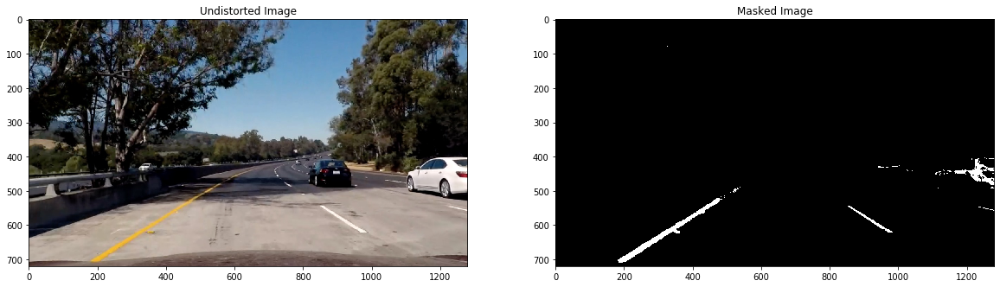

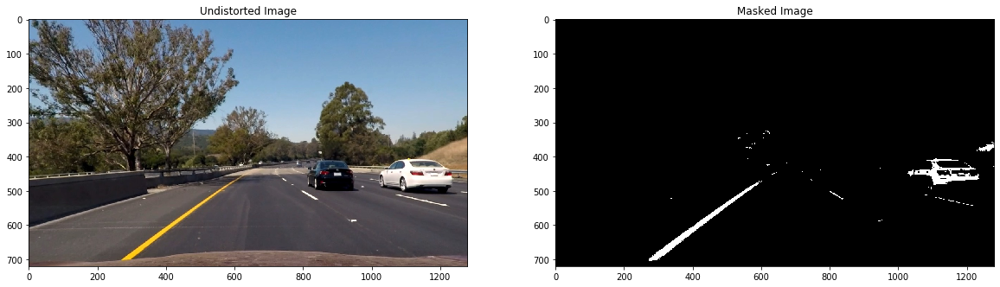

In [8]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    
    # apply color threshold
    hls_binary = hls_select(undistorted_img, s_thresh=(100, 255),l_thresh=(65, 255),h_thresh=(0, 55))

    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Undistorted Image')
    ax1.imshow(undistorted_img_rgb)
    ax2.set_title('Masked Image')
    ax2.imshow(hls_binary,cmap='gray');

## Combine Color and Gradient Thresholding

In [9]:
def combine_color_gradient_threshold(undistorted_img):
    # Choose a Sobel kernel size
    ksize = 7 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(undistorted_img, orient='x', sobel_kernel=ksize, thresh=(15, 255))
    grady = abs_sobel_thresh(undistorted_img, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    mag_binary = mag_thresh(undistorted_img, sobel_kernel=ksize, mag_thresh=(35, 255))
    dir_binary = dir_threshold(undistorted_img, sobel_kernel=ksize, thresh=(0.2, 1.15))
    hls_binary = hls_select(undistorted_img, s_thresh=(110, 255),l_thresh=(65, 255),h_thresh=(0, 60))
    
    combined_color_gradient = np.zeros_like(dir_binary)
    combined_color_gradient[(((gradx == 1) & (grady == 1) & (dir_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1)))| (hls_binary==1)] = 1
    
    return combined_color_gradient

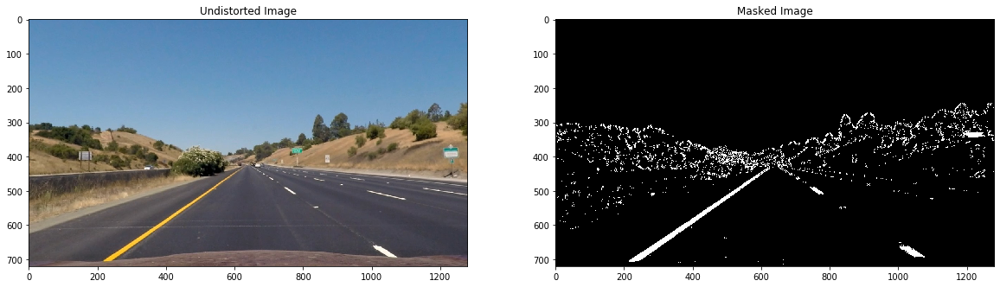

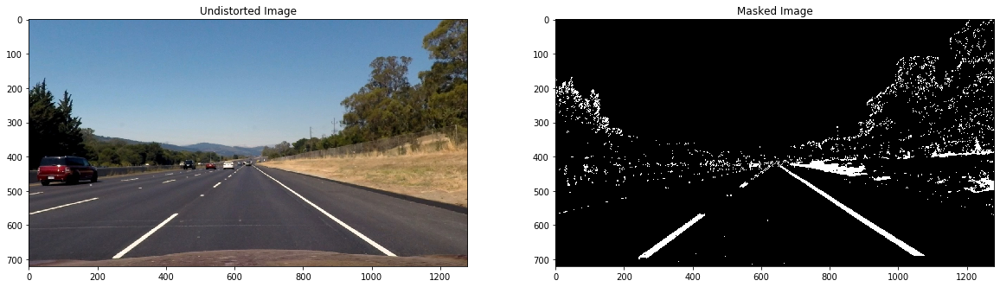

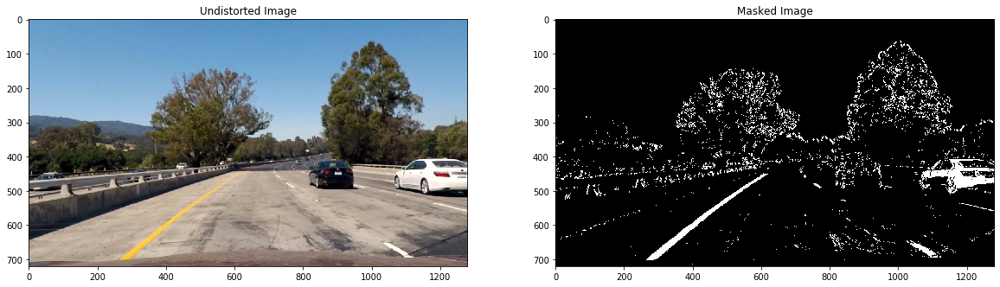

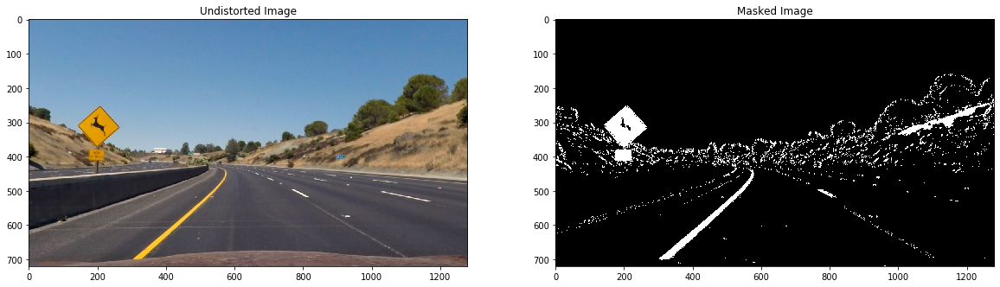

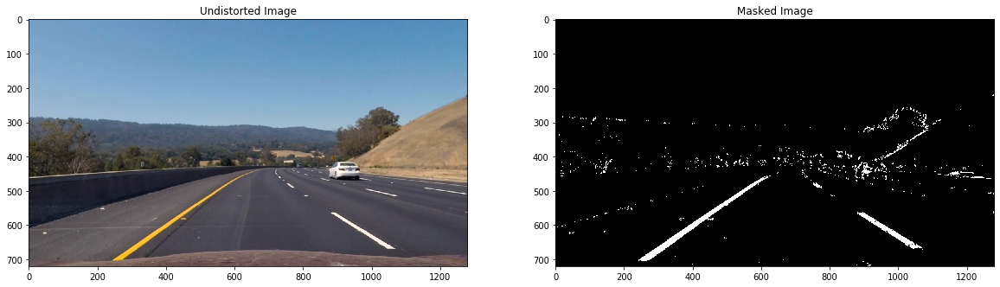

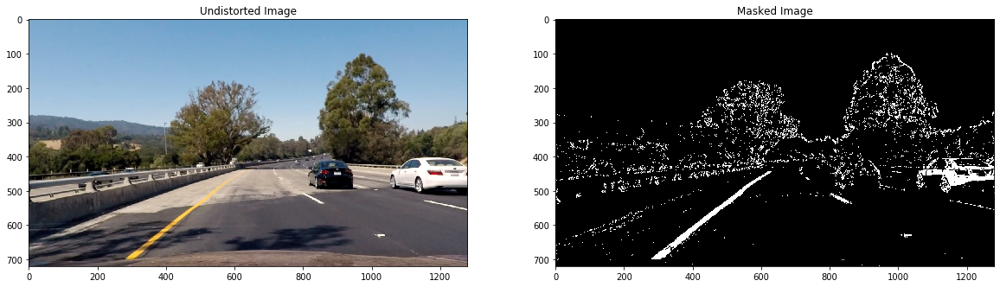

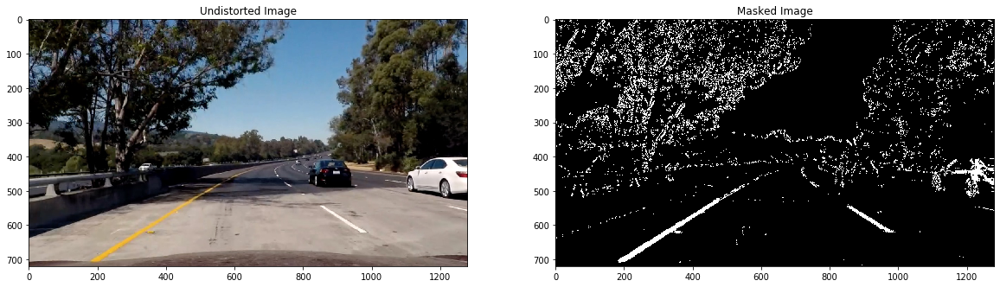

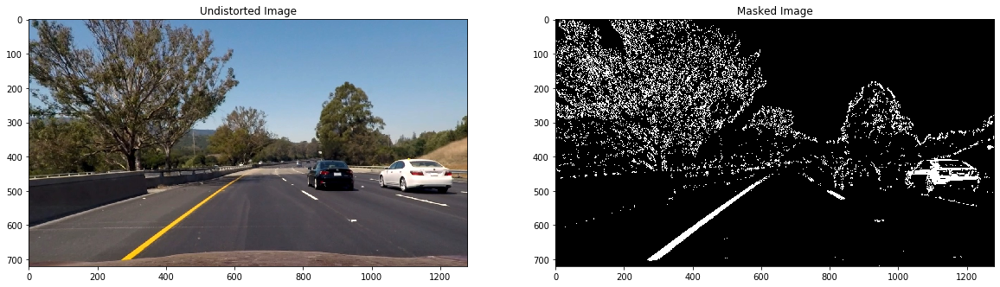

In [10]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Undistorted Image')
    ax1.imshow(undistorted_img_rgb)
    ax2.set_title('Masked Image')
    ax2.imshow(combined_color_gradient,cmap='gray');

## Apply a perspective transform to an image with straight lane lines:

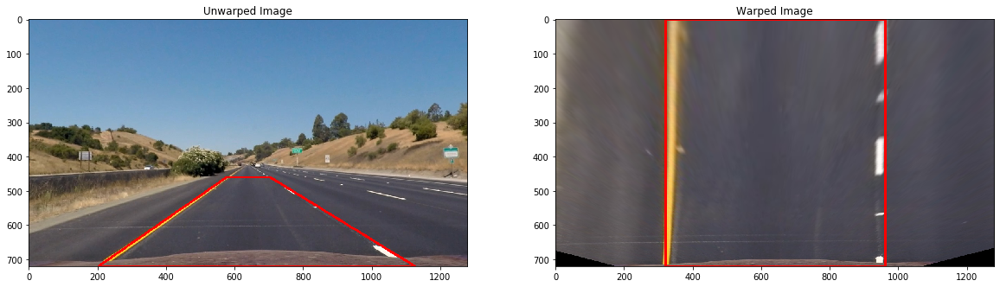

In [11]:
img = cv2.imread('test_images/straight_lines1.jpg')
undistorted_img = undistort_image(img,objpoints,imgpoints)
undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

img_size = (img.shape[1],img.shape[0])

src = np.float32(
[[(img_size[0] / 2) - 63, img_size[1] / 2 + 100],
[((img_size[0] / 6) - 10), img_size[1]],
[(img_size[0] * 5 / 6) + 60, img_size[1]],
[(img_size[0] / 2 + 63), img_size[1] / 2 + 100]])
dst = np.float32(
[[(img_size[0] / 4), 0],
[(img_size[0] / 4), img_size[1]],
[(img_size[0] * 3 / 4), img_size[1]],
[(img_size[0] * 3 / 4), 0]])


M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(undistorted_img_rgb, M, img_size, flags=cv2.INTER_LINEAR)

unwarped_pts = np.array(src, np.int32)
unwarped_pts = unwarped_pts.reshape((-1,1,2))
cv2.polylines(undistorted_img_rgb,[unwarped_pts],True,(255,0,0),thickness=5)

warped_pts = np.array(dst, np.int32)
warped_pts = warped_pts.reshape((-1,1,2))
cv2.polylines(warped,[warped_pts],True,(255,0,0),thickness=5)


# Vizualize unwarped image and warped image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Unwarped Image')
ax1.imshow(undistorted_img_rgb)
ax2.set_title('Warped Image')
ax2.imshow(warped,cmap='gray');


### Create a function for PerspectiveTransform

In [12]:
def perspective_transformation (img):
    img_size = (img.shape[1],img.shape[0])

    src = np.float32(
    [[(img_size[0] / 2) - 63, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 63), img_size[1] / 2 + 100]])
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

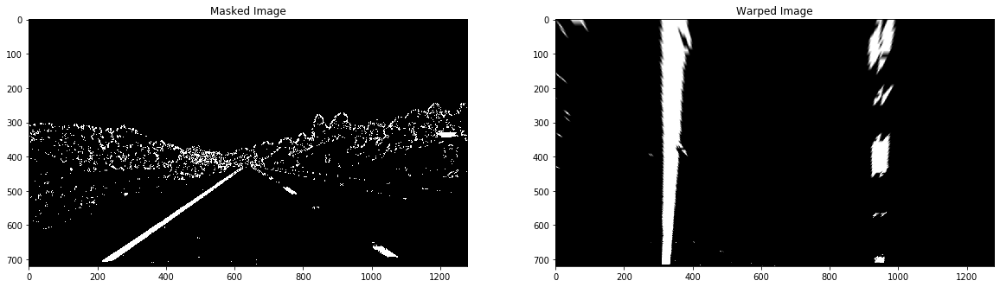

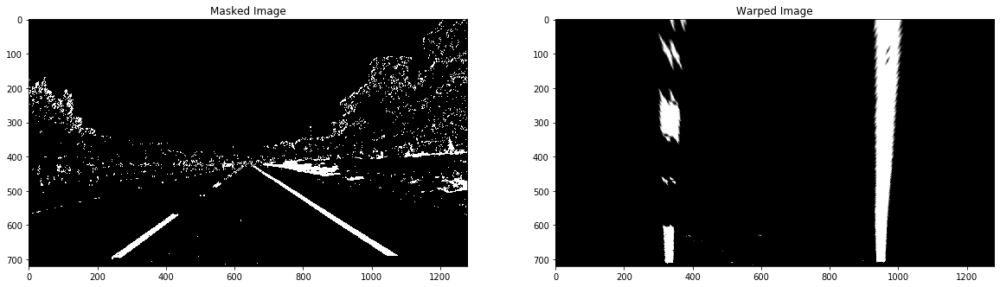

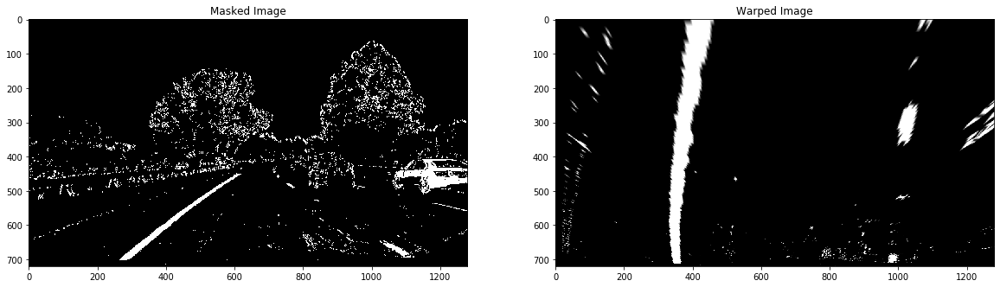

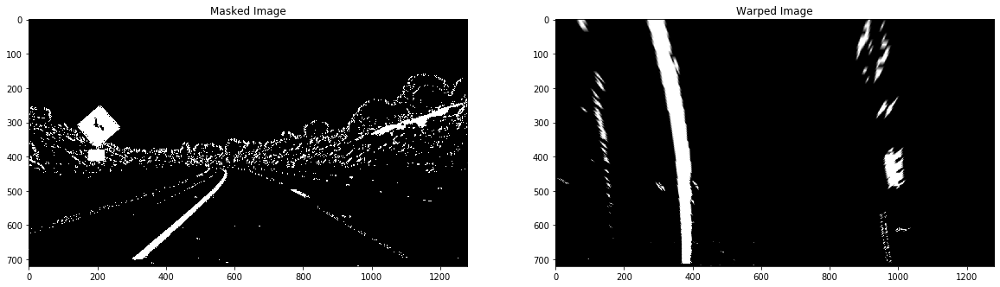

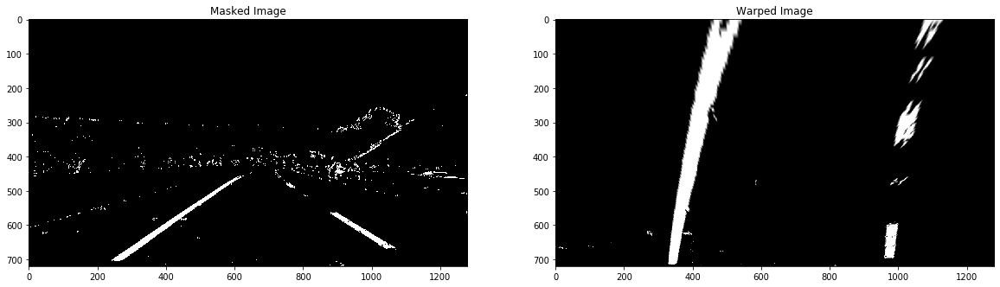

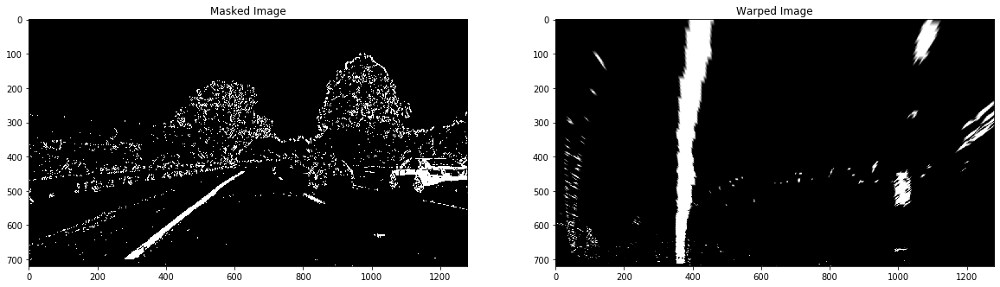

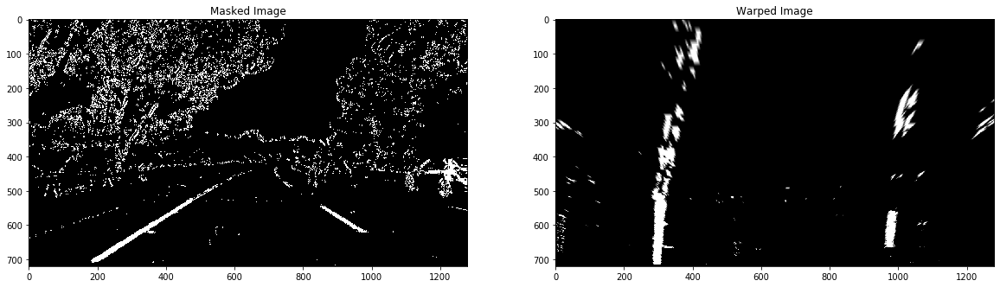

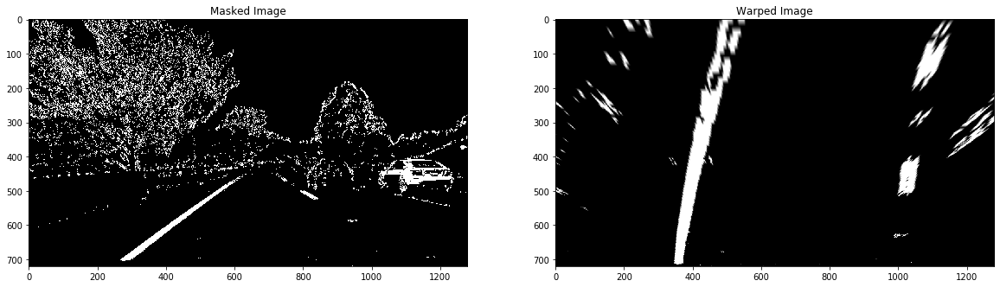

In [13]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    
    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Masked Image')
    ax1.imshow(combined_color_gradient,cmap='gray')
    ax2.set_title('Warped Image')
    ax2.imshow(warped,cmap='gray');

## Detecting Line Pixels

In [14]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

In [15]:
def find_lane_pixels(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint    = np.int(histogram.shape[0]//2)
    leftx_base  = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current  = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds  = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        # Find the four below boundaries of the window
        win_xleft_low = int(leftx_current - margin) # Update this
        win_xleft_high = int(leftx_current + margin)  # Update this
        win_xright_low = int(rightx_current - margin) # Update this
        win_xright_high = int(rightx_current + margin)  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

## Fit Line

In [16]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return left_fit,right_fit,left_fitx,right_fitx,ploty,out_img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


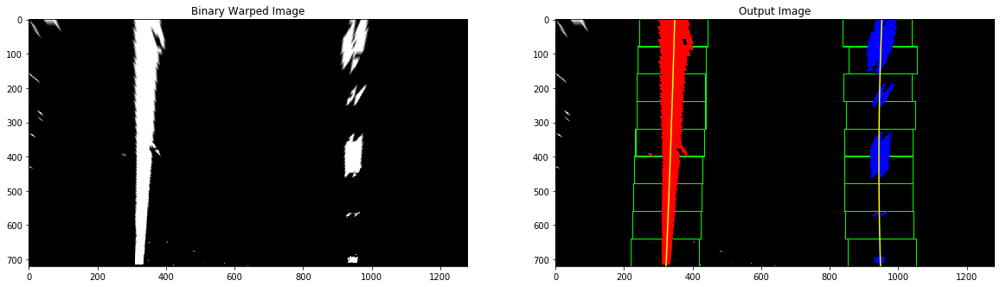

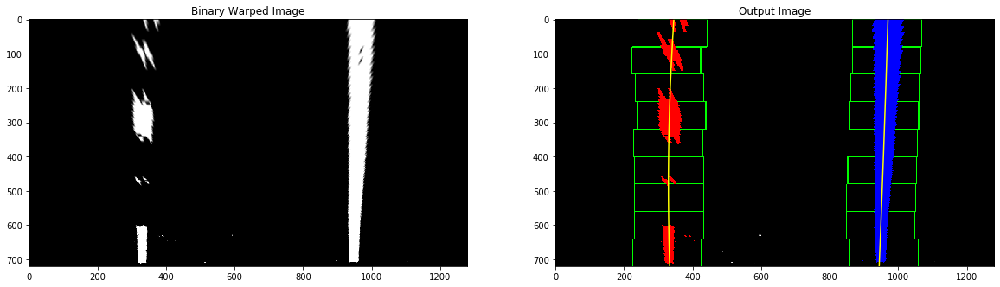

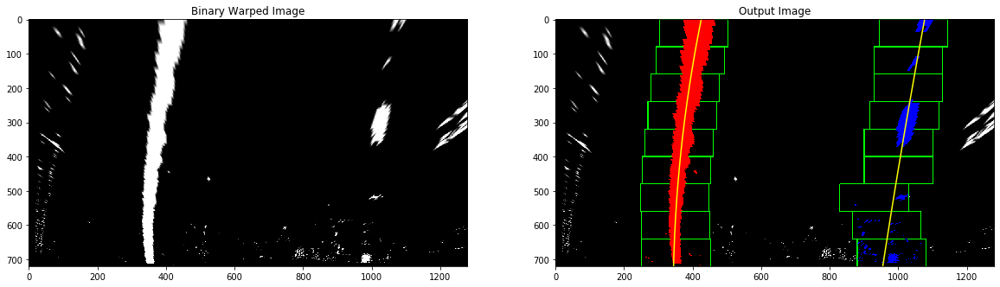

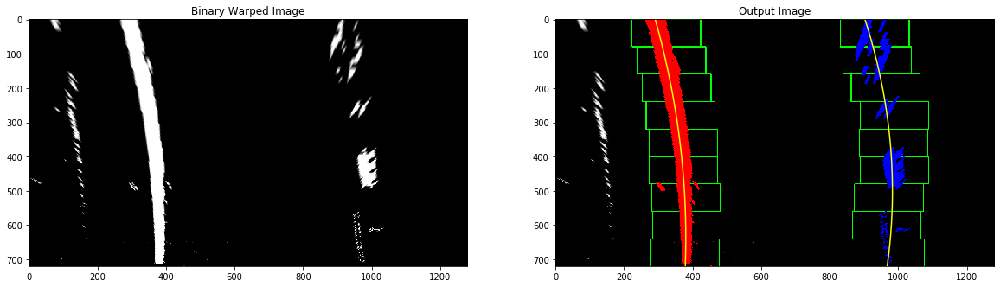

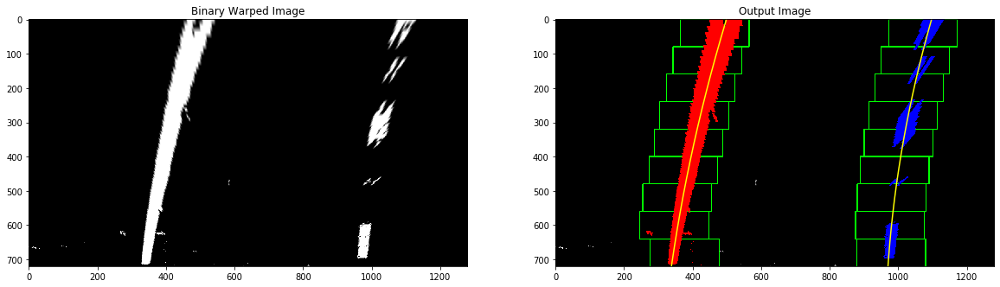

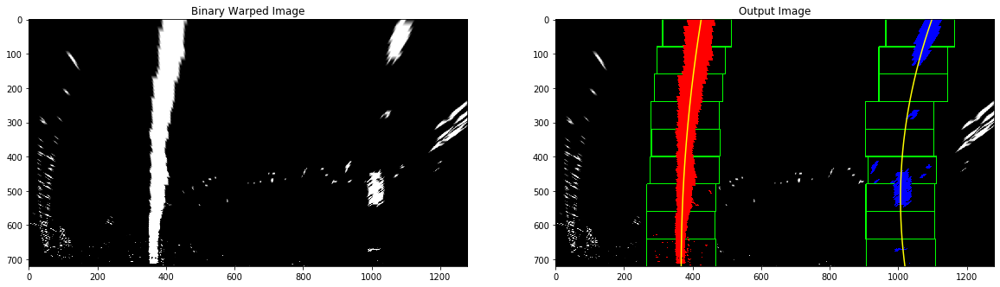

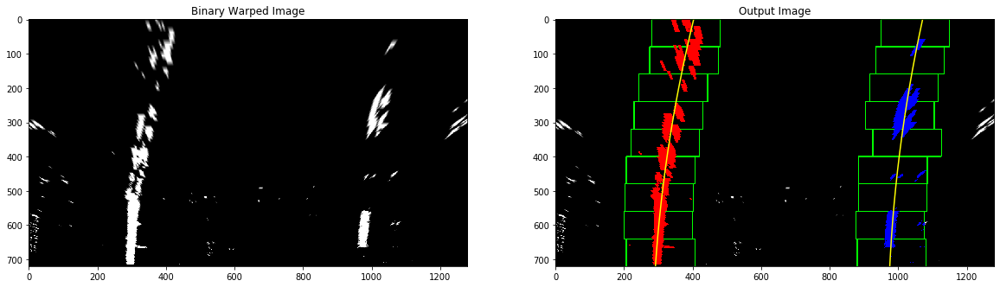

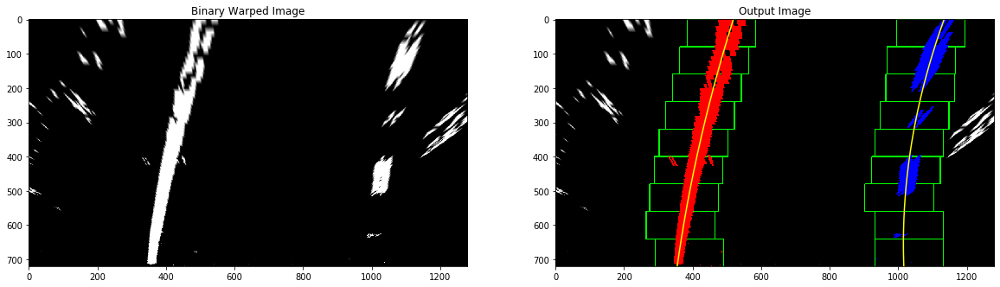

In [17]:
left_fits = []
right_fits = []
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    left_fit,right_fit,left_fitx,right_fitx,ploty,line_fit_img = fit_polynomial(warped)
    
    left_fits.append(left_fit)
    right_fits.append(right_fit)
    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Binary Warped Image')
    ax1.imshow(warped,cmap='gray')
    ax2.set_title('Output Image')
    ax2.imshow(line_fit_img,cmap='gray');
    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

## searching from prior using the lines found

In [18]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    
    # Fit a second order polynomial to each with np.polyfit()
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calc both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty, left_fit, right_fit

In [19]:
def search_around_poly(left_fit,right_fit,binary_warped):
    # HYPERPARAMETER
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty, left_fit, right_fit= fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return left_fitx,right_fitx,ploty,result,left_fit,right_fit

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


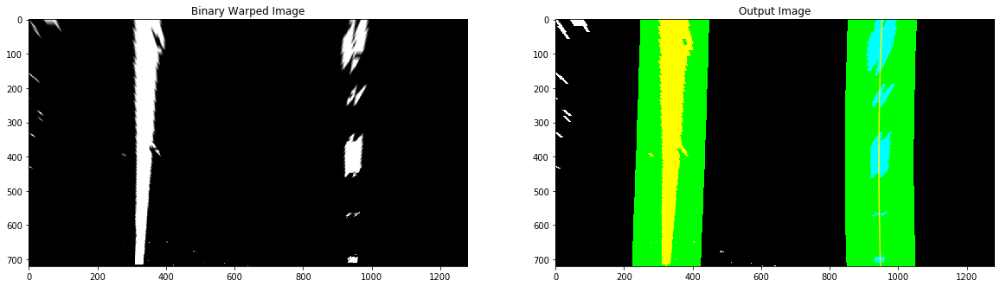

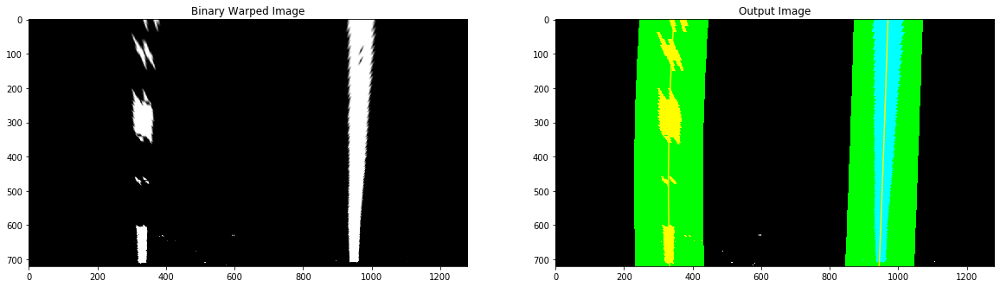

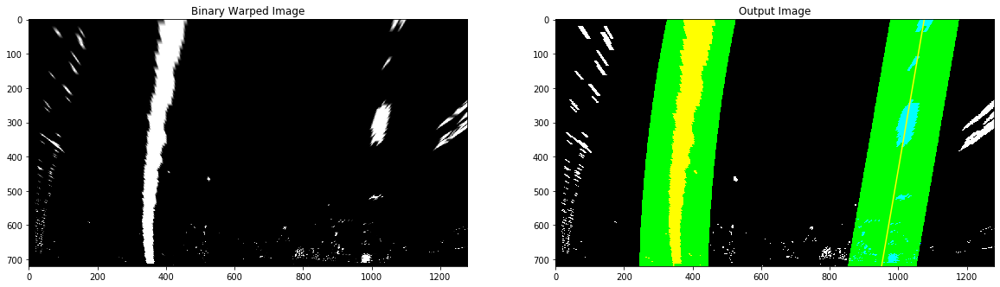

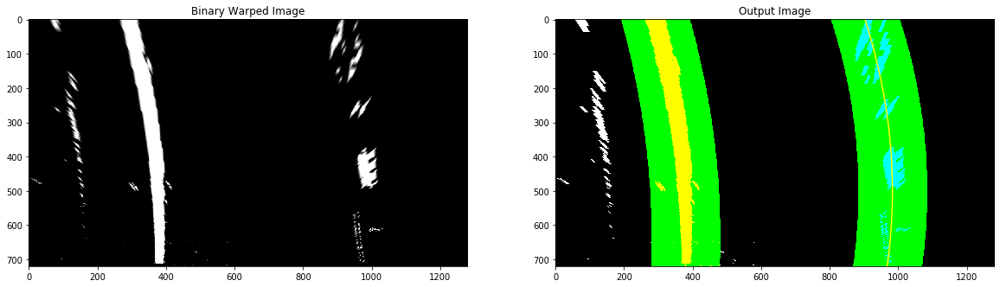

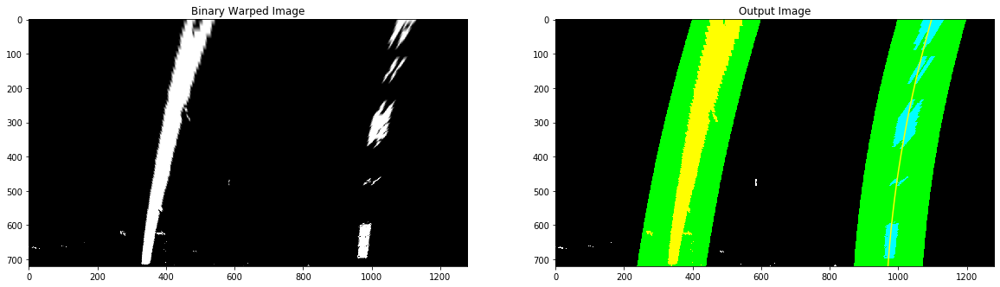

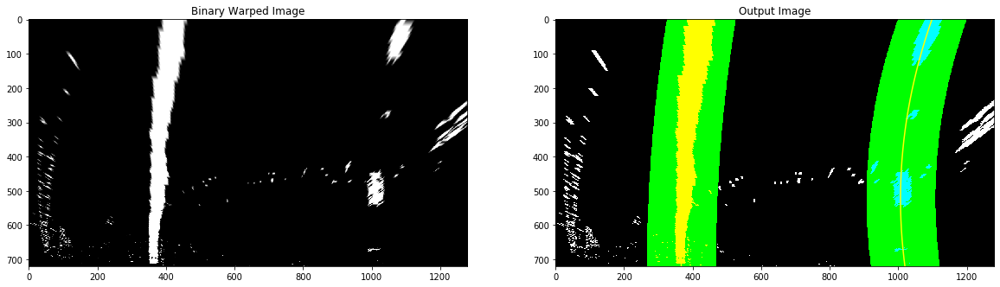

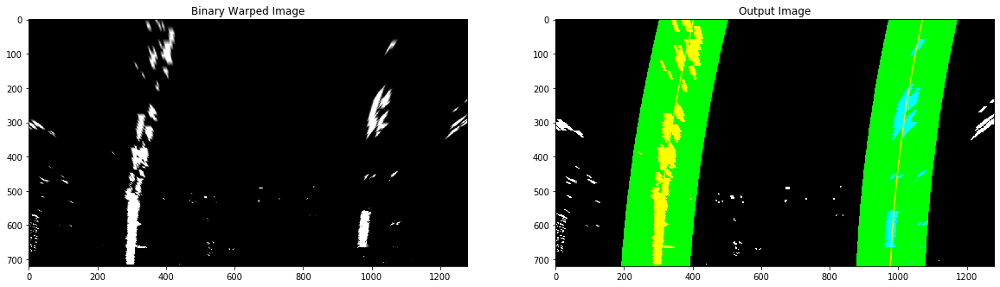

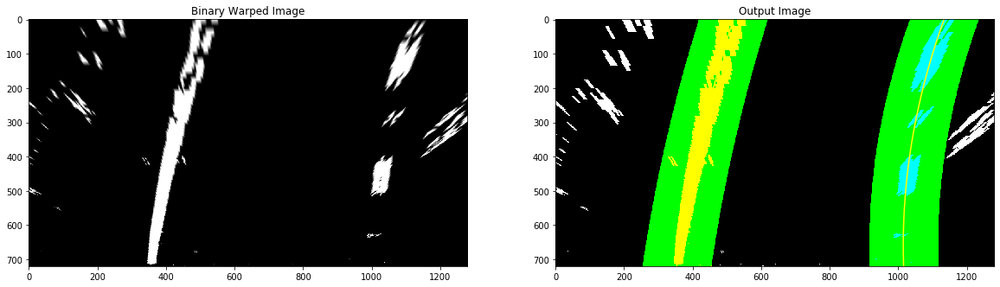

## Determine the curvature of the lane

### measuring curvature pixels

In [21]:
def measure_curvature_pixels(left_fit,right_fit,ploty):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Implement the calculation of R_curve (radius of curvature)
    left_curverad = np.power(1+np.square(2*left_fit[0]*y_eval+left_fit[1]),3/2)/abs(2*left_fit[0])  ## Implement the calculation of the left line here
    right_curverad = np.power(1+np.square(2*right_fit[0]*y_eval+right_fit[1]),3/2)/abs(2*right_fit[0])  ## Implement the calculation of the right line here
    
    return left_curverad, right_curverad

In [22]:
line_params_index = 0
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    left_fit = left_fits[line_params_index]
    right_fit= right_fits[line_params_index]
    
    left_fitx,right_fitx,ploty,line_fit_img,left_fit,right_fit = search_around_poly(left_fit,right_fit,warped)
    
    left_fits[line_params_index]=left_fit
    right_fits[line_params_index]=right_fit
    line_params_index=line_params_index+1
    
    left_curverad, right_curverad = measure_curvature_pixels(left_fit,right_fit,ploty)
    print(left_curverad,right_curverad)

54835.8745597 10083.224047
7342.11632434 67096.1459039
4051.75048278 143385.792565
2295.11817109 1614.00983156
4764.87140722 3341.29204577
4547.64958575 1536.26442912
4134.45863983 4144.79309787
4536.49953141 1832.6405112


### measuring real curvature

In [23]:
def measure_curvature_real(left_fit,right_fit,ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
     
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = xm_per_pix / np.power(ym_per_pix,2) * left_fit[0]*np.power(y_eval,2)+(xm_per_pix/ym_per_pix)*left_fit[1]*y_eval+left_fit[2]
    right_curverad = xm_per_pix / np.power(ym_per_pix,2) * right_fit[0]*np.power(y_eval,2)+(xm_per_pix/ym_per_pix)*right_fit[1]*y_eval+right_fit[2]

    return left_curverad, right_curverad

In [24]:
line_params_index = 0
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    left_fit = left_fits[line_params_index]
    right_fit= right_fits[line_params_index]
    
    left_fitx,right_fitx,ploty,line_fit_img,left_fit,right_fit = search_around_poly(left_fit,right_fit,warped)

    left_fits[line_params_index]=left_fit
    right_fits[line_params_index]=right_fit
    line_params_index=line_params_index+1
    
    left_curverad, right_curverad = measure_curvature_real(left_fit,right_fit,ploty)
    print(left_curverad,"m",right_curverad,"m")

331.176866004 m 1026.78456387 m
446.966230098 m 955.643680063 m
601.364980958 m 1053.36889772 m
-26.4607004318 m 430.583818343 m
641.667843639 m 1308.31501832 m
583.671109068 m 1591.72079258 m
572.757368272 m 1241.39480992 m
669.439339165 m 1530.7976846 m


## Determine vehicle position with respect to center.

In [25]:
def measure_midpoint_lanes(left_fitx,right_fitx,image_size):
    '''
    Calculates vehicle position with respect to center in meters.
    '''
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    return (((left_fitx[-1]+right_fitx[-1])/2)- image_size[0]/2)*xm_per_pix

In [26]:
line_params_index = 0
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    left_fit = left_fits[line_params_index]
    right_fit= right_fits[line_params_index]
    
    left_fitx,right_fitx,ploty,line_fit_img,left_fit,right_fit = search_around_poly(left_fit,right_fit,warped)

    left_fits[line_params_index]=left_fit
    right_fits[line_params_index]=right_fit
    line_params_index=line_params_index+1
    
    img_size = (warped.shape[1],warped.shape[0])
    
    left_curverad, right_curverad = measure_curvature_real(left_fit,right_fit,ploty)
    vehicle_pos = measure_midpoint_lanes(left_fitx,right_fitx,img_size)
    print(vehicle_pos)

-0.0229963985721
-0.0046390867866
0.0411046443754
0.177931517445
0.0763966436982
0.281646196412
-0.0284903464571
0.237968475485


## Tracking & Drawing

In [42]:
def unwarp_image(Minv,undist,warped,left_fitx,right_fitx,ploty):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

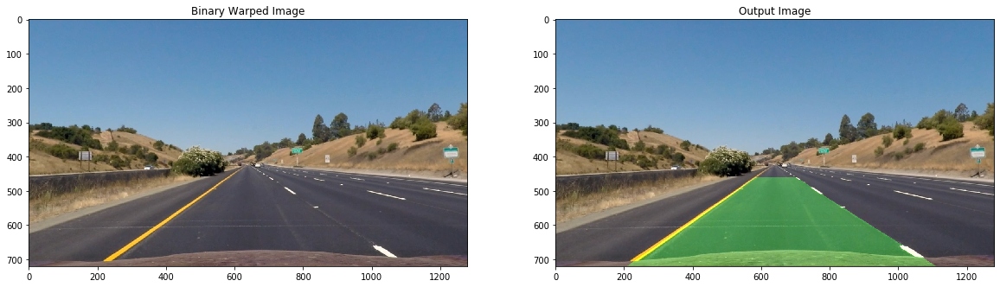

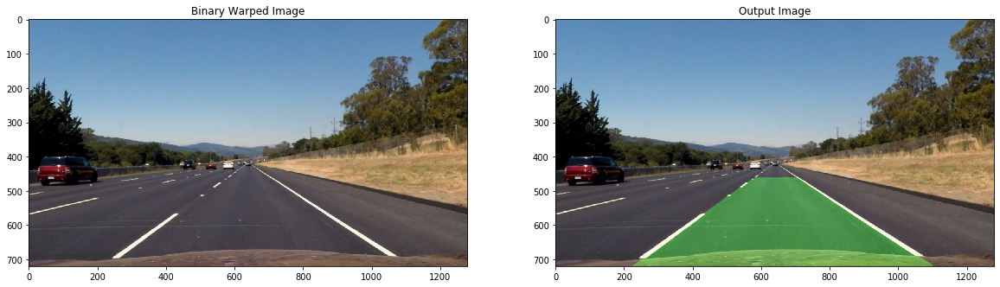

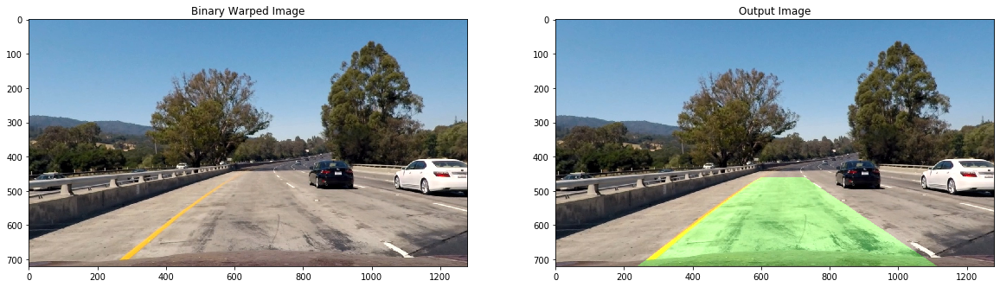

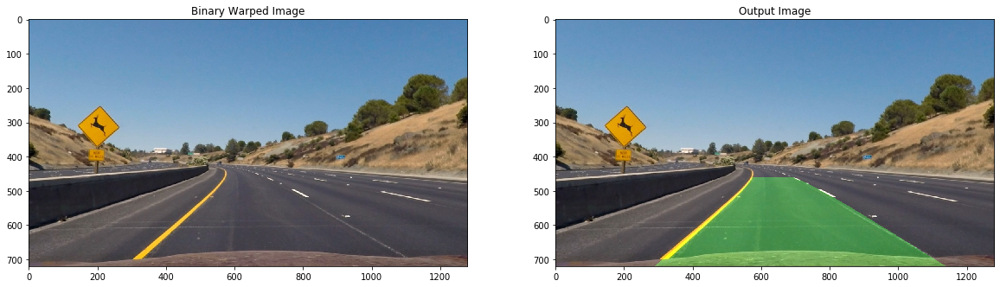

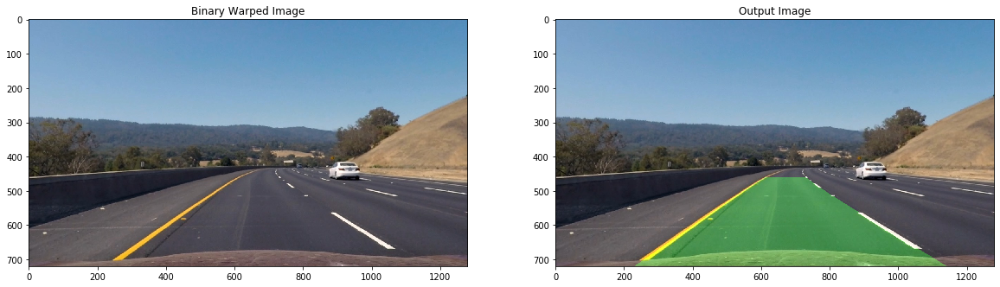

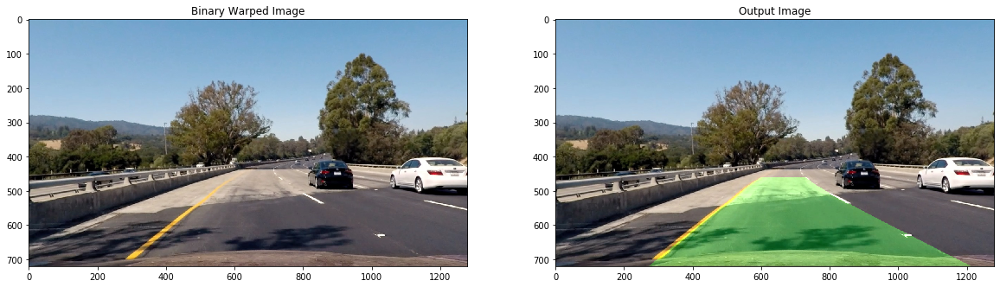

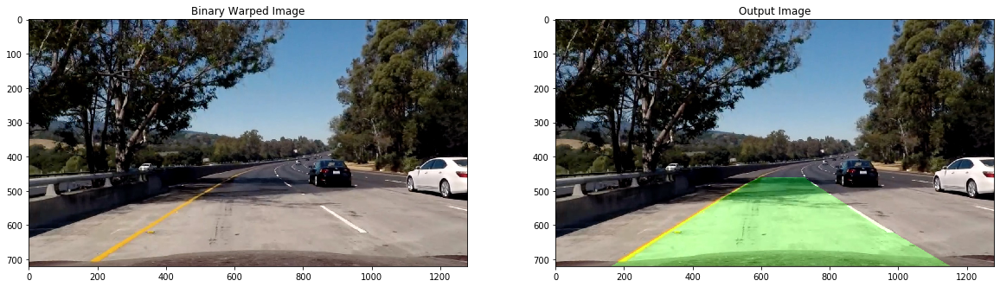

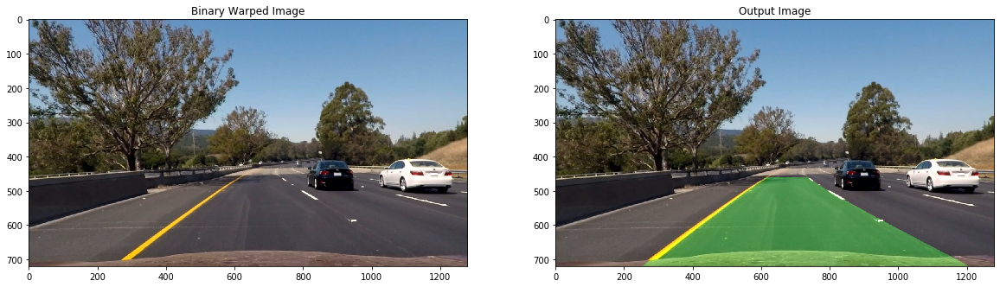

In [43]:
line_params_index = 0
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    undistorted_img = undistort_image(img,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)

    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    
    left_fit = left_fits[line_params_index]
    right_fit= right_fits[line_params_index]
    
    left_fitx,right_fitx,ploty,line_fit_img,left_fit,right_fit = search_around_poly(left_fit,right_fit,warped)
    
    left_fits[line_params_index]=left_fit
    right_fits[line_params_index]=right_fit
    line_params_index=line_params_index+1
    
    Minv = np.linalg.inv(M)
    drawn_image = unwarp_image(Minv,undistorted_img_rgb,warped,left_fitx,right_fitx,ploty)
    
    # Vizualize undistorted image and masked image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Binary Warped Image')
    ax1.imshow(undistorted_img_rgb)
    ax2.set_title('Output Image')
    ax2.imshow(drawn_image);

## Pipeline

In [44]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
def process_image(image):
    undistorted_img = undistort_image(image,objpoints,imgpoints)
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    combined_color_gradient = combine_color_gradient_threshold(undistorted_img)
    warped = perspective_transformation (combined_color_gradient)
    
    left_fit,right_fit,left_fitx,right_fitx,ploty,line_fit_img = fit_polynomial(warped)
        
    left_fits[line_params_index]=left_fit
    right_fits[line_params_index]=right_fit
    line_params_index=line_params_index+1

In [ ]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)